In [24]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms


from torchvision import models
from torchvision import datasets
from torchvision import  transforms
from torch.utils.data import DataLoader, Subset

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier

In [8]:
!pip install tensorboard

     ---------------------------------------- 5.5/5.5 MB 16.9 MB/s eta 0:00:00
     -------------------------------------- 130.2/130.2 kB 8.0 MB/s eta 0:00:00
     -------------------------------------- 184.2/184.2 kB 5.4 MB/s eta 0:00:00
     ---------------------------------------- 3.7/3.7 MB 7.4 MB/s eta 0:00:00
     ------------------------------------- 422.5/422.5 kB 27.5 MB/s eta 0:00:00
     -------------------------------------- 151.7/151.7 kB 4.6 MB/s eta 0:00:00


In [25]:
# Importa las clases y funciones necesarias
from model.resnet import ResNet18  # (o la arquitectura de tu elección)
#from train import BaseTrainer
from utils.args import get_args
from utils.train import fix_seed
from cg_function import calc_cg_score
from base_trainer import BaseTrainer

In [26]:

from torch.utils.data import DataLoader, Subset
BATCH_SIZE= None
#Get dataset
train_dataset = datasets.CIFAR10('/data/cifar10/', train=True, download=True,
        transform=transforms.Compose([
            transforms.Resize(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ]))

trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE,
            num_workers=8, shuffle = False)

test_dataset = datasets.CIFAR10('/data/cifar10/', train=False, download=True,
        transform=transforms.Compose([
            transforms.Resize(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ]))

testloader = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE,
            num_workers=8, shuffle = False)

Files already downloaded and verified
Files already downloaded and verified


In [101]:
import torch
print(torch.__version__)

2.0.1+cpu


In [102]:
!pip install torch -U

In [27]:
import random

random.seed(0)  # Semilla para las funciones aleatorias de Python

#Separacion de subset con numero de clases represatitivo
train_size = 1500
test_size = 50000 - train_size

pre_subset_train_dataset, resto = torch.utils.data.random_split(train_dataset, [train_size, test_size])
#Si se hace un random split de tamaño 1000 no se mantienen 100 imagenes para cada clase, por ello hacemos
#una busqueda por indices y almacenamos 100 imagenes por clase. Como son 1024 el numero especifico es:
#-clase 0:103
#-clase 1:103
#-clase 2:103
#-clase 3:103
#-resto 102
#Contabilizar numero de imagenes por clase
dict_numero_imagenes = {}
dict_indices = {}

for i in range(0,10):
  clase = "clase_" + str(i)
  dict_indices[clase] = []
  if i in [0, 1, 2, 3]:
    dict_numero_imagenes[clase] = 103
  else:
    dict_numero_imagenes[clase] = 102



In [28]:
dict_numero_imagenes

{'clase_0': 103,
 'clase_1': 103,
 'clase_2': 103,
 'clase_3': 103,
 'clase_4': 102,
 'clase_5': 102,
 'clase_6': 102,
 'clase_7': 102,
 'clase_8': 102,
 'clase_9': 102}

In [29]:
#Busqueda de indices por clases
for i in range(0,10):
  key = "clase_" + str(i)
  valor_n_imagenes = dict_numero_imagenes[key]
  for j in range(0,1500):
    if valor_n_imagenes == len(dict_indices[key]):
      break
    if pre_subset_train_dataset[j][1] == i:
      dict_indices[key].append(j)


In [141]:
subset_train_dataset[104][1]

1

In [30]:

from torch.utils.data import DataLoader,Subset
#Creamos subsets por temas de memoria

# Número de muestras
num_samples = 1024 #Funciona correctamente con 750

#subset_train_dataset = Subset(train_dataset, range(num_samples))
#subset_trainloader = DataLoader(subset_train_dataset, batch_size=BATCH_SIZE, num_workers=8, shuffle=False)

subset_train_dataset = []

for i in range(0,10):
  key = "clase_" + str(i)
  valor_n_imagenes = dict_numero_imagenes[key]
  for j in range(0,valor_n_imagenes):
    indice_a_insertar = dict_indices[key][j]
    subset_train_dataset.append(pre_subset_train_dataset[indice_a_insertar])

subset_trainloader = DataLoader(subset_train_dataset, batch_size=BATCH_SIZE, num_workers=8, shuffle=False)

del train_dataset
del test_dataset
del pre_subset_train_dataset
del dict_numero_imagenes

In [31]:
dict_indices['clase_0']

[16,
 18,
 20,
 29,
 32,
 36,
 81,
 83,
 91,
 110,
 122,
 132,
 151,
 153,
 158,
 171,
 185,
 188,
 201,
 207,
 211,
 222,
 226,
 246,
 256,
 263,
 265,
 273,
 289,
 293,
 304,
 336,
 344,
 355,
 394,
 424,
 432,
 438,
 440,
 451,
 453,
 481,
 486,
 493,
 527,
 542,
 551,
 552,
 558,
 565,
 568,
 571,
 579,
 588,
 594,
 601,
 603,
 605,
 606,
 633,
 634,
 658,
 671,
 682,
 693,
 720,
 721,
 732,
 739,
 744,
 762,
 764,
 765,
 785,
 790,
 791,
 800,
 810,
 825,
 850,
 867,
 868,
 875,
 889,
 890,
 892,
 901,
 906,
 909,
 916,
 917,
 926,
 930,
 937,
 945,
 946,
 950,
 952,
 954,
 992,
 994,
 1000,
 1005]

In [32]:
model = models.resnet18(pretrained=True)  # Puedes usar otro modelo preentrenado si lo deseas

c:\Users\User\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\User\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [89]:
a = subsets['clase_7']
len(a)

102

In [33]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
cg_scores = calc_cg_score(subset_train_dataset, device=device, rep_num=1, unbalance_ratio=1, sub_term=False)
print(cg_scores)

c:\Users\User\Desktop\CG_score\cg_function.py:58: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  new_dataset[key] = np.array(data_list, dtype=object)


[17.46877229  0.09171989  0.04611924 ...  0.60493144  1.08801941
  3.66578901]


In [34]:
cg_scores[0]

17.468772289723006

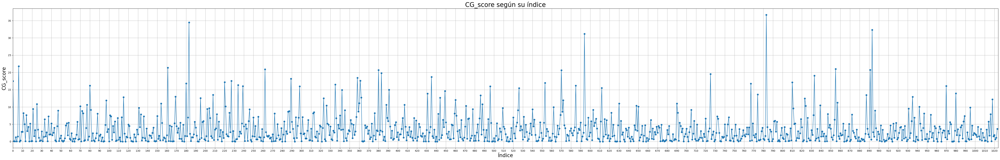

In [35]:
import matplotlib.pyplot as plt


indices = list(range(len(cg_scores)))

# Graficar los valores respecto a sus índices
plt.figure(figsize=(70, 10)) 
plt.plot(indices, cg_scores, marker='o', linestyle='-')
plt.xlabel('Índice', fontsize=20)
plt.ylabel('CG_score', fontsize=20)
plt.title('CG_score según su índice', fontsize=25)
plt.grid(True)

plt.xticks(range(0, len(cg_scores), 10))  # Cambiar los ticks del eje X
plt.xlim(0, len(cg_scores))  # Establecer los límites del eje X
plt.show()

In [36]:
import pandas as pd
# Número de datos por clase
datos_por_clase = {
    'clase_0': 103,
    'clase_1': 103,
    'clase_2': 103,
    'clase_3': 103,
    'clase_4': 102,
    'clase_5': 102,
    'clase_6': 102,
    'clase_7': 102,
    'clase_8': 102,
    'clase_9': 102
}

# Convertir el diccionario a un DataFrame
datos_divididos = {}
inicio = 0
for clase, cantidad in datos_por_clase.items():
    fin = inicio + cantidad
    datos_divididos[clase] = cg_scores[inicio:fin]
    inicio = fin

df = pd.DataFrame.from_dict(datos_divididos, orient='index').transpose()

# Mostrar las primeras filas del DataFrame
df.head()

,clase_0,clase_1,clase_2,clase_3,clase_4,clase_5,clase_6,clase_7,clase_8,clase_9
0,17.468772,0.532566,1.579004,0.385026,4.155698,1.317571,2.012470,2.215744,4.151641,4.049101
1,0.091720,4.495542,1.018326,3.730589,1.350319,0.000043,6.152104,1.276941,0.050858,4.242044
2,0.046119,2.657647,13.491764,0.190424,2.977726,0.032230,0.930771,6.629435,0.400770,0.424267
3,1.248726,5.794524,0.442625,8.143800,1.110261,0.788847,1.845715,0.092244,12.470376,3.382985
4,0.027457,0.136053,3.435654,8.483133,0.286187,3.897867,0.092189,0.213451,10.331534,0.868757


In [41]:
sd_por_clase = df.std()
sd_por_clase

clase_0    4.084841
clase_1    4.975590
clase_2    4.613931
clase_3    4.677002
clase_4    3.984895
clase_5    4.847402
clase_6    2.666336
clase_7    4.873145
clase_8    5.085964
clase_9    3.255328
dtype: float64

In [44]:
promedio_por_clase = df.mean()
promedio_por_clase

clase_0    3.188853
clase_1    3.401032
clase_2    3.807663
clase_3    4.447810
clase_4    3.574402
clase_5    4.014188
clase_6    2.505517
clase_7    3.112239
clase_8    3.340757
clase_9    2.974413
dtype: float64

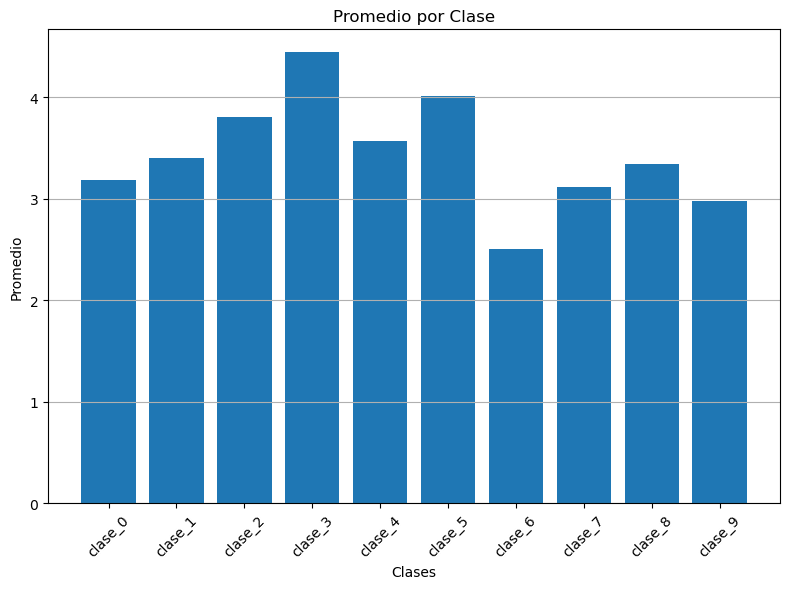

In [45]:
# Calcular el promedio por cada columna (clase)
promedio_por_clase = df.mean()

# Crear un gráfico de barras para el promedio por clase
plt.figure(figsize=(8, 6))
plt.bar(promedio_por_clase.index, promedio_por_clase.values)
plt.xlabel('Clases')
plt.ylabel('Promedio')
plt.title('Promedio por Clase')
plt.xticks(rotation=45)  # Rotar los nombres de las clases para mejor visualización
plt.grid(axis='y')  # Mostrar líneas de la cuadrícula en el eje Y
plt.tight_layout()  # Ajustar el diseño para evitar recorte de etiquetas
plt.show()

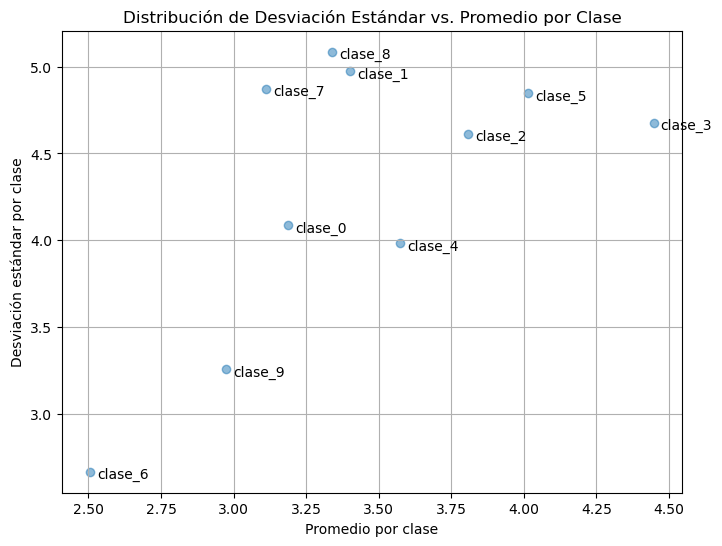

In [46]:
import pandas as pd
import matplotlib.pyplot as plt


# promedio y la desviación estándar
promedio_por_clase = df.mean()
desviacion_estandar_por_clase = df.std()

# Crear un nuevo DataFrame con el promedio y la desviación estándar por clase
datos_resumen = pd.DataFrame({
    'Promedio': promedio_por_clase,
    'Desviacion_Estandar': desviacion_estandar_por_clase
})

# Graficar la distribución de desviación estándar vs. promedio
plt.figure(figsize=(8, 6))
plt.scatter(datos_resumen['Promedio'], datos_resumen['Desviacion_Estandar'], alpha=0.5)

for i, txt in enumerate(datos_resumen.index):
    plt.annotate(txt, (datos_resumen['Promedio'][i], datos_resumen['Desviacion_Estandar'][i]), xytext=(5, -5), textcoords='offset points')
plt.xlabel('Promedio por clase')
plt.ylabel('Desviación estándar por clase')
plt.title('Distribución de Desviación Estándar vs. Promedio por Clase')
plt.grid(True)
plt.show()


In [48]:
df.columns

Index(['clase_0', 'clase_1', 'clase_2', 'clase_3', 'clase_4', 'clase_5',
       'clase_6', 'clase_7', 'clase_8', 'clase_9'],
      dtype='object')

In [51]:
df.max()


clase_0    21.807401
clase_1    34.459818
clase_2    20.914292
clase_3    20.683226
clase_4    18.697054
clase_5    31.164063
clase_6    11.005792
clase_7    36.687994
clase_8    32.321783
clase_9    16.076757
dtype: float64

In [50]:
df['clase_6'].std()

2.666335540468005

In [49]:
df['clase_6']

0      2.012470
1      6.152104
2      0.930771
3      1.845715
4      0.092189
         ...   
98     1.132884
99     3.008417
100    1.106722
101    0.161915
102         NaN
Name: clase_6, Length: 103, dtype: float64

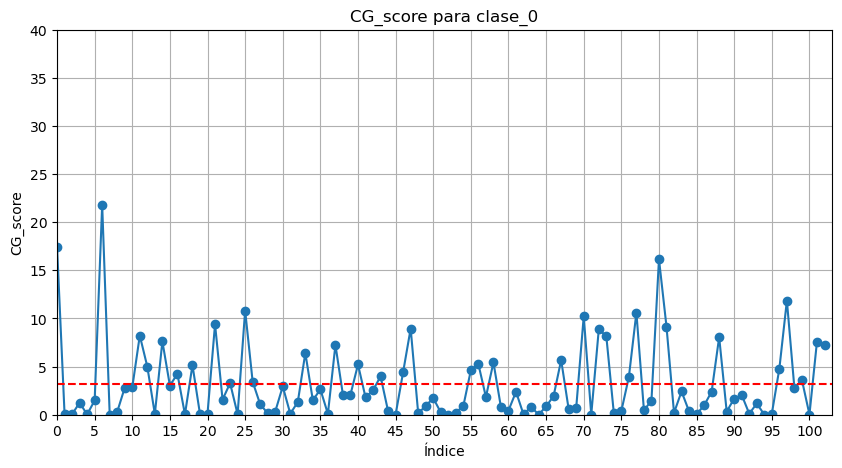

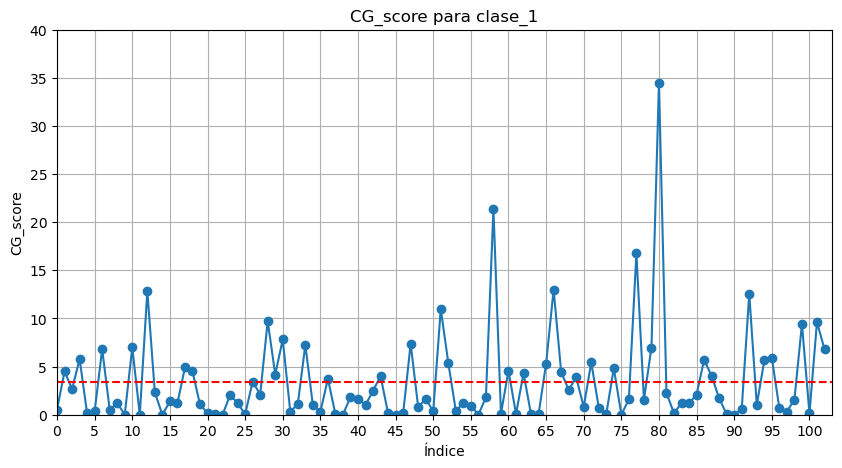

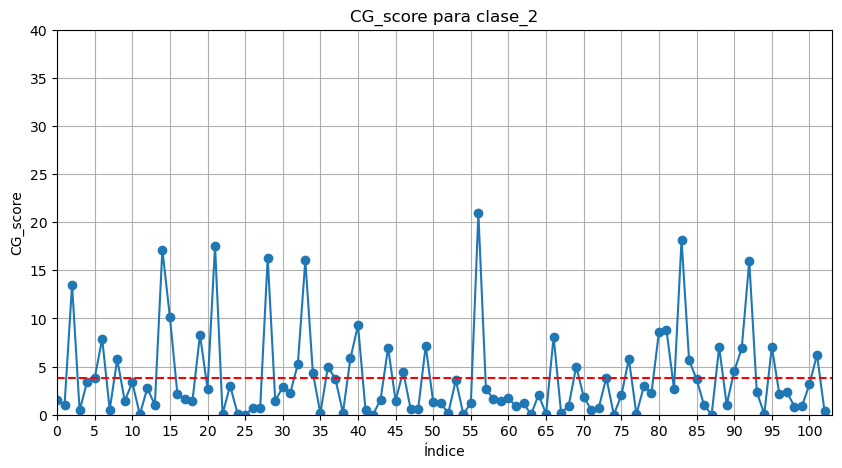

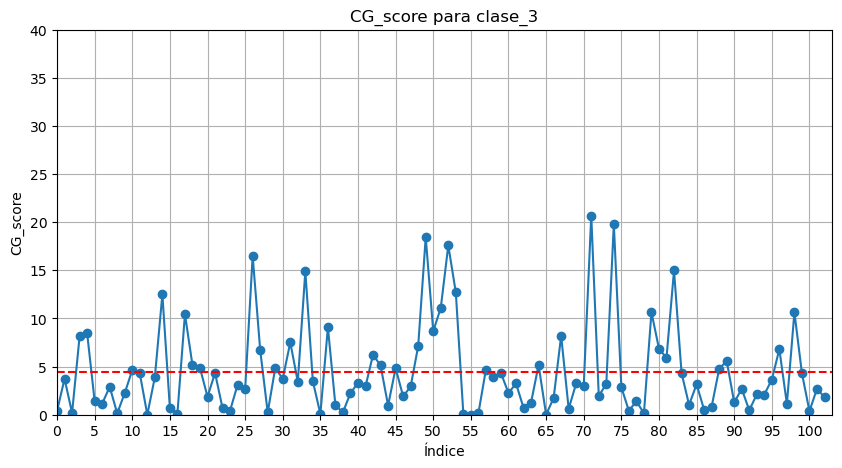

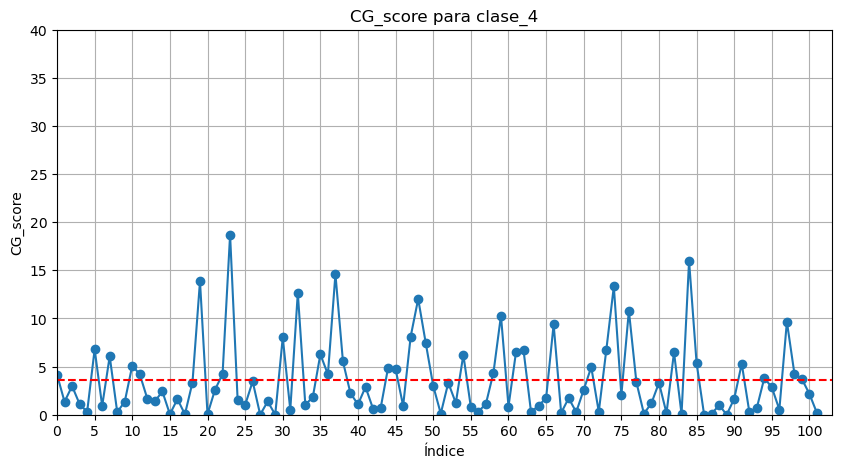

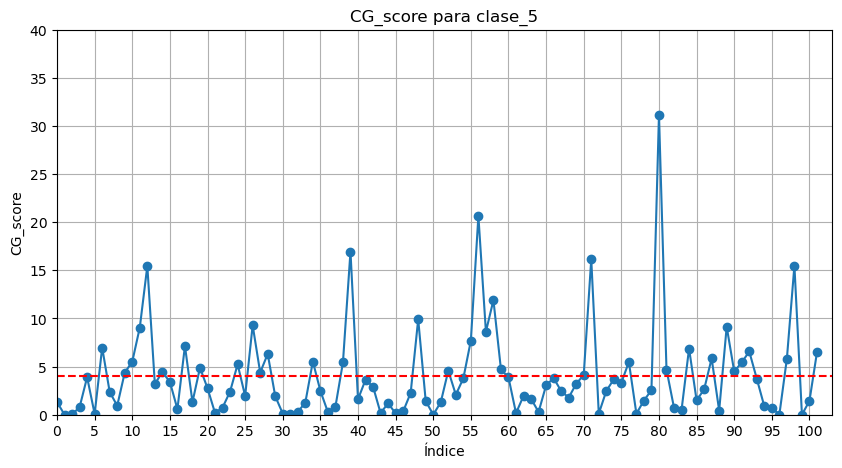

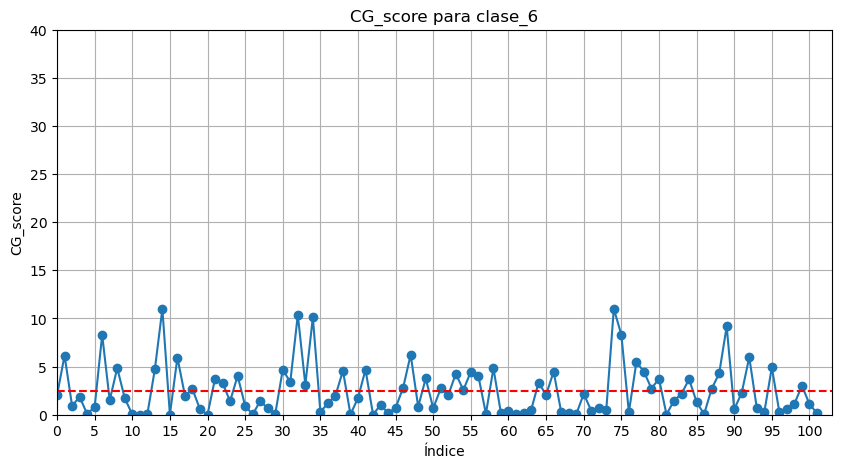

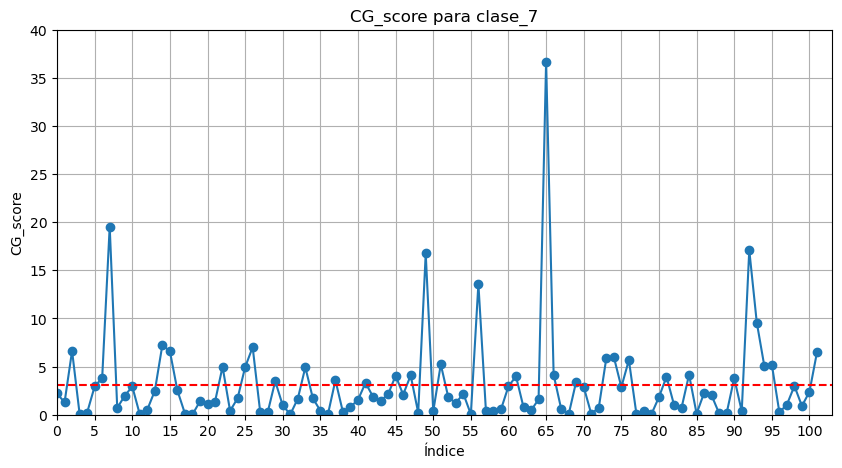

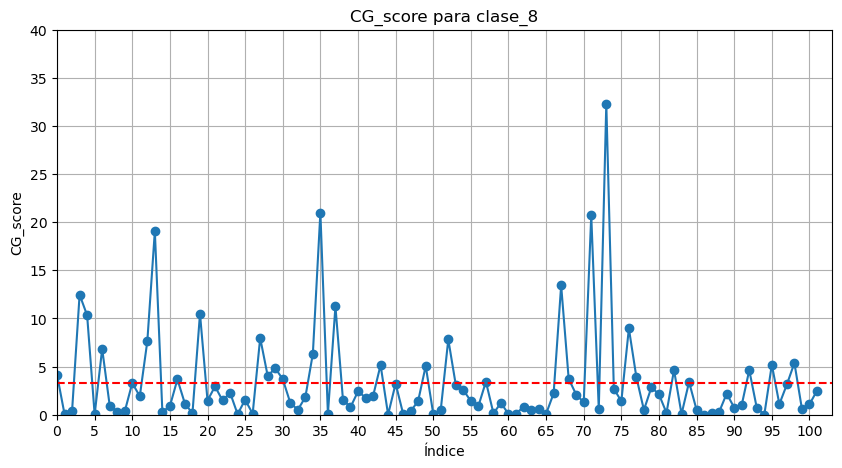

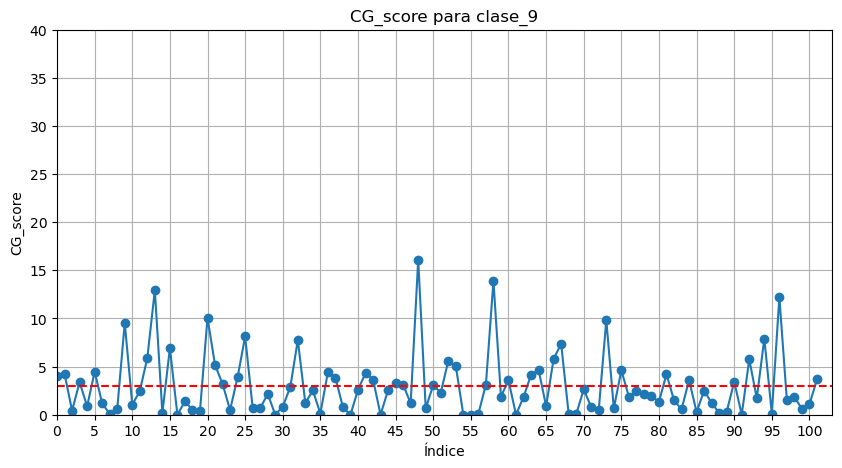

In [52]:
for columna in df.columns:
    plt.figure(figsize=(10, 5))  
    plt.plot(df[columna], marker='o', linestyle='-')
    promedio = df[columna].mean()
    plt.axhline(y=promedio, color='red', linestyle='--')
    plt.xlabel('Índice')
    plt.ylabel('CG_score')
    plt.title(f'CG_score para {columna}')
    plt.grid(True)
    plt.xticks(range(0, len(df[columna]), 5))
    plt.xlim(0, len(df[columna]))
    plt.ylim(0, 40)
    plt.show()

In [72]:
promedios = df.mean()

df_alto = pd.DataFrame()
df_bajo = pd.DataFrame()

for columna in df.columns:
    promedio_columna = promedios[columna]
    df_alto[columna] = df[columna][df[columna] > promedio_columna]
    df_bajo[columna] = df[columna][df[columna] <= promedio_columna]

In [59]:

df_2= df.copy()
promedios = df_2.mean()

# Agregar columnas al DataFrame original para indicar si cada valor es mayor que el promedio
for columna in df_2.columns:
    promedio_columna = promedios[columna]
    df_2[f'{columna}_mayor_promedio'] = df_2[columna] > promedio_columna


df_2

,clase_0,clase_1,clase_2,clase_3,clase_4,clase_5,clase_6,clase_7,clase_8,clase_9,clase_0_mayor_promedio,clase_1_mayor_promedio,clase_2_mayor_promedio,clase_3_mayor_promedio,clase_4_mayor_promedio,clase_5_mayor_promedio,clase_6_mayor_promedio,clase_7_mayor_promedio,clase_8_mayor_promedio,clase_9_mayor_promedio
0,17.468772,0.532566,1.579004,0.385026,4.155698,1.317571,2.012470,2.215744,4.151641,4.049101,True,False,False,False,True,False,False,False,True,True
1,0.091720,4.495542,1.018326,3.730589,1.350319,0.000043,6.152104,1.276941,0.050858,4.242044,False,True,False,False,False,False,True,False,False,True
2,0.046119,2.657647,13.491764,0.190424,2.977726,0.032230,0.930771,6.629435,0.400770,0.424267,False,False,True,False,False,False,False,True,False,False
3,1.248726,5.794524,0.442625,8.143800,1.110261,0.788847,1.845715,0.092244,12.470376,3.382985,False,True,False,True,False,False,False,False,True,True
4,0.027457,0.136053,3.435654,8.483133,0.286187,3.897867,0.092189,0.213451,10.331534,0.868757,False,False,False,True,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98,2.759252,1.567530,0.852922,10.635835,4.267569,15.487191,1.132884,2.989010,5.383888,1.850828,False,False,False,True,True,True,False,False,True,False
99,3.603055,9.414191,0.891199,4.308016,3.703474,0.003250,3.008417,0.907690,0.597453,0.604931,True,True,False,False,True,False,True,False,False,False
100,0.022878,0.130708,3.152076,0.372531,2.153175,1.433614,1.106722,2.381351,1.080834,1.088019,False,False,False,False,False,False,False,False,False,False
101,7.607378,9.629348,6.246370,2.697483,0.168358,6.494351,0.161915,6.485942,2.491315,3.665789,True,True,True,False,False,True,False,True,False,True


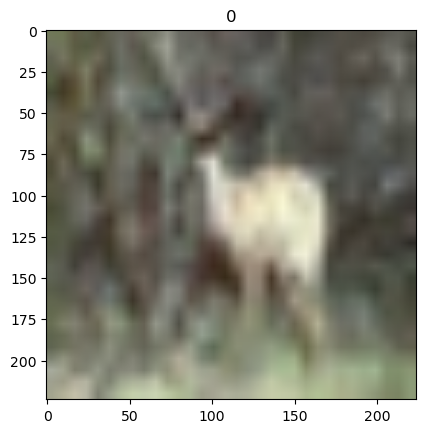

In [64]:
import matplotlib.pyplot as plt
import numpy as numpy
import torch
import numpy
import matplotlib.pyplot as plt
from torchvision import models, datasets, transforms
from sklearn.neighbors import KNeighborsClassifier
import tqdm
import numpy as np

def imshow(inp, title=None, mean=numpy.array([0.485, 0.456, 0.406]),std=numpy.array([0.229, 0.224, 0.225])):
    """Show torch tensor"""
    inp = inp.numpy().transpose((1, 2, 0))
    inp = std * inp + mean
    inp = numpy.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

def imshow_grid(tensors, img_titles=None, title=None,
                mean=numpy.array([0.485, 0.456, 0.406]),
                std=numpy.array([0.229, 0.224, 0.225]),images_per_row = 4):
    """Display a grid of images from tensors"""

    # Ajusta esto según el número de imágenes que deseas por fila
    images_per_row = images_per_row

    if images_per_row == 1:
      num_rows = 1

      # Ajusta el tamaño de la figura según sea necesario
      figsize = (images_per_row * 5, num_rows * 5)

      _, axarr = plt.subplots(num_rows, images_per_row, figsize=figsize)

      inp = tensors[0]

      inp = inp.numpy().transpose((1, 2, 0))
      inp = std * inp + mean
      inp = numpy.clip(inp, 0, 1)

      axarr.imshow(inp)
      if img_titles is not None:
          axarr.set_title(img_titles[0])

      if title is not None:
        plt.suptitle(title, fontsize=15)

      plt.pause(0.001)
      plt.show()

    else:

        # Calcula el número de filas necesario
        num_rows = len(tensors) // images_per_row + int(bool(len(tensors) % images_per_row))

        # Ajusta el tamaño de la figura según sea necesario
        figsize = (images_per_row * 5, num_rows * 5)

        _, axarr = plt.subplots(num_rows, images_per_row, figsize=figsize)

        for i in range(len(axarr.flatten())):
            axarr.flatten()[i].set_yticks([])
            axarr.flatten()[i].set_xticks([])

        for i in range(len(tensors)):
            inp = tensors[i]

            inp = inp.numpy().transpose((1, 2, 0))
            inp = std * inp + mean
            inp = numpy.clip(inp, 0, 1)

            row_index = i // images_per_row
            col_index = i % images_per_row

            if num_rows == 1:
                axarr[col_index].imshow(inp)
                if img_titles is not None:
                    axarr[col_index].set_title(img_titles[i])
            else:
                axarr[row_index, col_index].imshow(inp)
                if img_titles is not None:
                    axarr[row_index, col_index].set_title(img_titles[i])

        if title is not None:
            plt.suptitle(title, fontsize=20)

        plt.pause(0.001)
        plt.show()
#Imshow de la primera imagen
imshow(subset_train_dataset[415][0], title=subset_train_dataset[0][1])

In [171]:
df_2[df_2['clase_0_mayor_promedio'] == True]

,clase_0,clase_1,clase_2,clase_3,clase_4,clase_5,clase_6,clase_7,clase_8,clase_9,clase_0_mayor_promedio,clase_1_mayor_promedio,clase_2_mayor_promedio,clase_3_mayor_promedio,clase_4_mayor_promedio,clase_5_mayor_promedio,clase_6_mayor_promedio,clase_7_mayor_promedio,clase_8_mayor_promedio,clase_9_mayor_promedio
1,4.927123,0.362934,0.245643,0.457703,1.559733,2.225109,0.890524,3.827555,0.049538,8.153846,True,False,False,False,False,False,False,True,False,True
3,17.173426,7.590571,0.222718,0.001780,8.090471,2.476880,11.227773,0.007303,6.282121,0.188835,True,True,False,False,True,False,True,False,True,False
4,3.957037,5.807788,1.199702,1.924826,1.825432,0.699817,0.370635,0.674054,1.138073,2.748606,True,True,False,False,False,False,False,False,False,True
7,9.631836,5.503766,1.824748,2.671781,10.634346,3.171726,1.295576,0.228296,3.978798,0.010802,True,True,False,False,True,True,False,False,True,False
9,7.153780,0.066933,3.270193,4.152094,0.209104,0.092198,0.811162,0.305959,7.192511,0.352266,True,False,False,True,False,False,False,False,True,False
12,5.477300,2.120848,0.120624,4.770419,6.498790,7.381892,8.413077,0.416957,0.367497,2.350712,True,False,False,True,True,True,True,False,False,False
16,6.436364,0.873560,7.606157,3.813939,0.822289,6.234219,0.050449,0.205182,0.303160,0.155533,True,False,True,False,False,True,False,False,False,False
21,4.420657,1.517777,1.164357,3.765871,12.126063,2.397444,0.522536,9.853346,1.074893,1.244271,True,False,False,False,True,False,False,True,False,False
23,4.429040,0.790390,5.611525,0.547987,0.315852,8.632453,9.095038,4.603109,6.769193,0.101156,True,False,True,False,False,True,True,True,True,False
27,3.480021,5.822152,3.504068,2.291108,1.647144,0.091195,1.831911,3.911275,0.186449,0.320704,True,True,False,False,False,False,False,True,False,False


In [74]:
df_ordenado_bajo = df_bajo.sort_values(by='clase_6', ascending=True)
df_ordenado_bajo

,clase_0,clase_1,clase_2,clase_3,clase_4,clase_5,clase_6,clase_7,clase_8,clase_9
42,2.549375,2.487208,0.004310,NaN,0.619590,2.914432,0.003905,1.869766,1.924657,NaN
20,0.118011,0.155933,2.709344,1.864865,0.045268,2.753423,0.006627,1.063757,1.475906,NaN
15,3.030008,1.388758,NaN,0.682468,0.054329,3.414153,0.016629,NaN,0.894778,NaN
10,2.833662,NaN,3.355936,NaN,NaN,NaN,0.024086,2.939687,3.294998,1.058396
39,2.087573,1.839961,NaN,2.246124,2.218190,NaN,0.035424,0.811947,0.778871,0.000003
...,...,...,...,...,...,...,...,...,...,...
84,0.351313,1.209925,NaN,1.021575,NaN,NaN,NaN,NaN,NaN,NaN
87,2.396877,NaN,0.002272,0.830435,0.102575,NaN,NaN,1.997170,0.222707,1.216228
89,0.328724,0.033040,1.039460,NaN,0.006302,NaN,NaN,0.186711,2.194132,0.294102
92,0.104213,NaN,NaN,0.467409,0.329102,NaN,NaN,NaN,NaN,NaN


In [61]:
df_ordenado = df_alto.sort_values(by='clase_6', ascending=False)
df_ordenado

,clase_0,clase_1,clase_2,clase_3,clase_4,clase_5,clase_6,clase_7,clase_8,clase_9
14,7.627722,NaN,17.164147,12.499909,NaN,4.428549,11.005792,7.247315,NaN,NaN
6,21.807401,6.809558,7.898096,NaN,NaN,6.977247,8.299767,3.812788,6.848647,NaN
47,8.949551,7.389841,NaN,NaN,8.121228,NaN,6.234784,4.082651,NaN,NaN
16,4.245033,NaN,NaN,NaN,NaN,NaN,5.940409,NaN,3.674092,NaN
77,10.613255,16.788671,NaN,NaN,NaN,NaN,5.458381,NaN,3.886574,NaN
58,5.436608,21.355189,NaN,NaN,4.354714,11.910958,4.836672,NaN,NaN,13.917660
55,4.628301,NaN,NaN,NaN,NaN,7.707156,4.477660,NaN,NaN,NaN
88,8.061556,NaN,7.012538,4.762523,NaN,NaN,4.282854,NaN,NaN,NaN
56,5.256563,NaN,20.914292,NaN,NaN,20.659245,4.019576,13.596313,NaN,NaN
21,9.402311,NaN,17.522785,NaN,NaN,NaN,3.753898,NaN,NaN,5.169159


In [ ]:
datos_por_clase = {
    'clase_0': 103,
    'clase_1': 103,
    'clase_2': 103,
    'clase_3': 103,
    'clase_4': 102,
    'clase_5': 102,
    'clase_6': 102,
    'clase_7': 102,
    'clase_8': 102,
    'clase_9': 102
}
103+103+103+103+102+102
103+103+103
sorted_idx_dataset = sorted_idx +103+103+103
sorted_idx_dataset

In [82]:
sorted_idx = df_ordenado.index
sorted_idx_dataset = sorted_idx +103+103+103+103+102+102
sorted_idx_dataset

Int64Index([630, 622, 663, 632, 693, 674, 671, 704, 672, 637, 696, 649, 715,
            662, 634, 616, 627, 628, 639, 641, 642, 653, 656, 659, 683, 686,
            688, 689, 692, 697, 712, 713, 717, 718],
           dtype='int64')

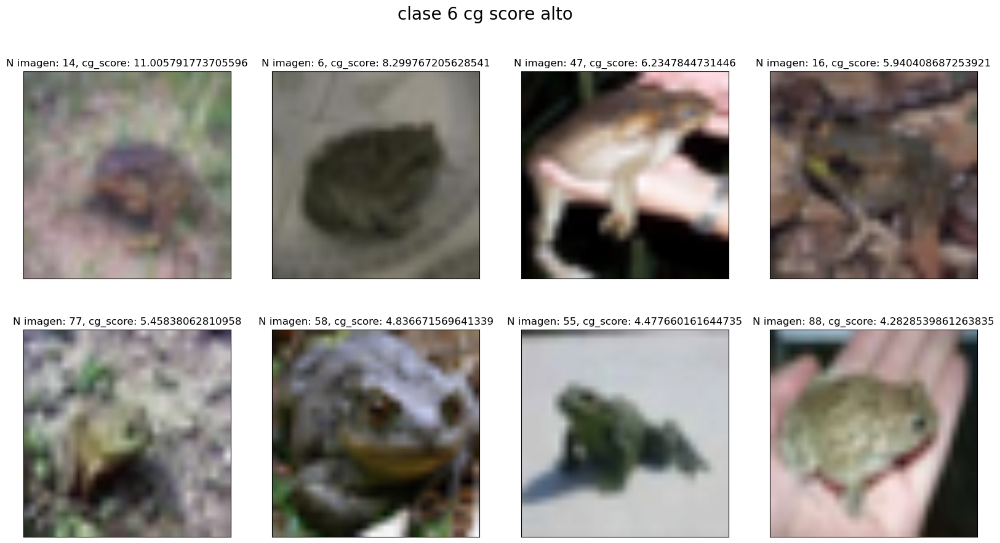

In [87]:
sorted_idx = df_ordenado.index
sorted_idx_dataset = sorted_idx +103+103+103+103+102+102
sorted_idx_dataset
largo = len(sorted_idx)
cg_score_value = df_ordenado['clase_6']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx_dataset[:8]],[f'N imagen: {x}, cg_score: {cg_score_value[x]}'for x in sorted_idx[:8]],
title = 'clase 6 cg score alto', images_per_row = 4)

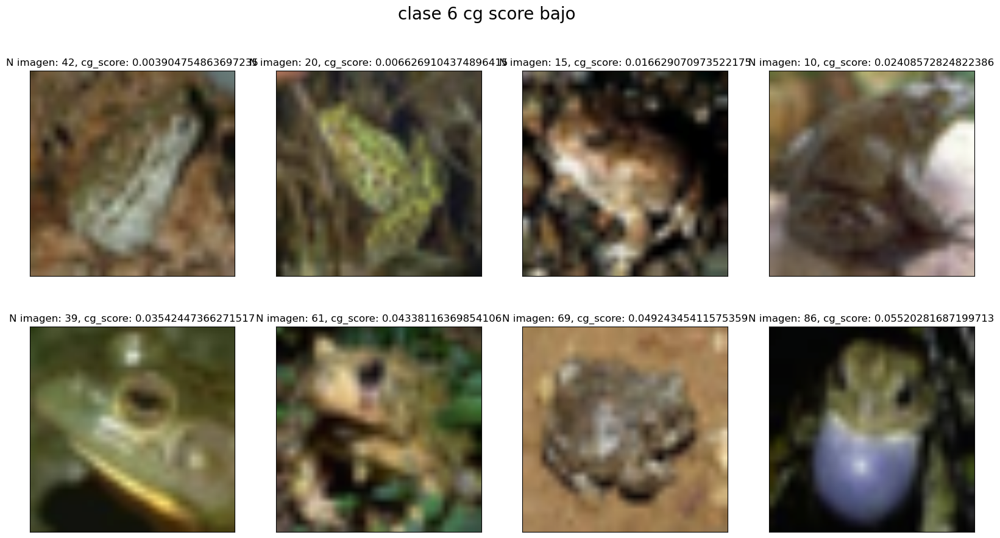

In [88]:
sorted_idx = df_ordenado_bajo.index
sorted_idx_dataset = sorted_idx +103+103+103+103+102+102
sorted_idx_dataset
largo = len(sorted_idx)
cg_score_value = df_ordenado_bajo['clase_6']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx_dataset[:8]],[f'N imagen: {x}, cg_score: {cg_score_value[x]}'for x in sorted_idx[:8]],
title = 'clase 6 cg score bajo', images_per_row = 4)

In [76]:
df_ordenado_bajo_3 = df_bajo.sort_values(by='clase_3', ascending=True)
df_ordenado_bajo_3

,clase_0,clase_1,clase_2,clase_3,clase_4,clase_5,clase_6,clase_7,clase_8,clase_9
65,0.857185,NaN,0.083244,0.012365,1.719155,3.060135,2.061771,NaN,0.090330,0.888538
35,2.638980,0.293068,0.141261,0.075530,NaN,2.482765,0.286797,0.411818,NaN,0.122498
54,0.903735,1.207606,0.044382,0.102431,NaN,3.774396,NaN,2.187348,2.558087,0.000587
8,0.303007,1.207934,NaN,0.139451,0.268493,0.933358,NaN,0.714729,0.328359,0.574319
78,0.470408,1.573298,2.978142,0.141679,0.107293,1.475719,NaN,0.391868,0.492795,2.181032
...,...,...,...,...,...,...,...,...,...,...
74,0.173998,NaN,0.000008,NaN,NaN,3.682419,NaN,NaN,2.705001,0.663190
79,1.450586,NaN,2.254900,NaN,1.200212,2.550073,NaN,0.061131,2.856946,1.924983
82,0.193314,0.145857,2.691289,NaN,NaN,0.720733,1.470122,1.027966,NaN,1.505453
89,0.328724,0.033040,1.039460,NaN,0.006302,NaN,NaN,0.186711,2.194132,0.294102


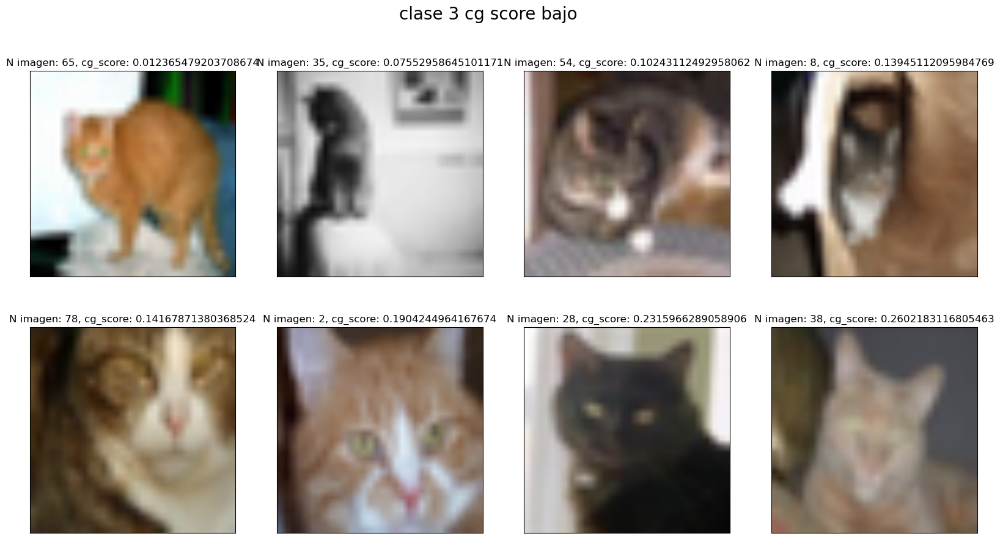

In [89]:
sorted_idx = df_ordenado_bajo_3.index
sorted_idx_dataset_3 = sorted_idx +103+103+103
sorted_idx_dataset_3
largo = len(sorted_idx)
cg_score_value = df_ordenado_bajo_3['clase_3']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx_dataset_3[:8]],[f'N imagen: {x}, cg_score: {cg_score_value[x]}'for x in sorted_idx[:8]],
title = 'clase 3 cg score bajo', images_per_row = 4)

In [77]:
df_ordenado_3 = df_alto.sort_values(by='clase_3', ascending=False)
df_ordenado_3

,clase_0,clase_1,clase_2,clase_3,clase_4,clase_5,clase_6,clase_7,clase_8,clase_9
26,3.426809,3.434525,NaN,16.503694,NaN,9.294691,NaN,7.014115,NaN,NaN
33,6.419542,7.262366,16.042039,14.909081,NaN,NaN,3.112640,4.927752,NaN,NaN
14,7.627722,NaN,17.164147,12.499909,NaN,4.428549,11.005792,7.247315,NaN,NaN
67,5.681890,4.451236,NaN,8.193848,NaN,NaN,NaN,NaN,13.439195,7.363513
80,16.161113,34.459818,8.612343,6.864711,NaN,31.164063,3.744221,NaN,NaN,NaN
96,4.788052,NaN,NaN,6.807813,NaN,NaN,NaN,NaN,NaN,12.215921
81,9.158454,NaN,8.787075,5.909685,NaN,4.691595,NaN,3.952214,NaN,4.206643
18,5.152143,4.503174,NaN,5.156519,NaN,NaN,2.671362,NaN,NaN,NaN
43,3.982578,4.018988,NaN,5.114236,NaN,NaN,NaN,NaN,5.163382,NaN
88,8.061556,NaN,7.012538,4.762523,NaN,NaN,4.282854,NaN,NaN,NaN


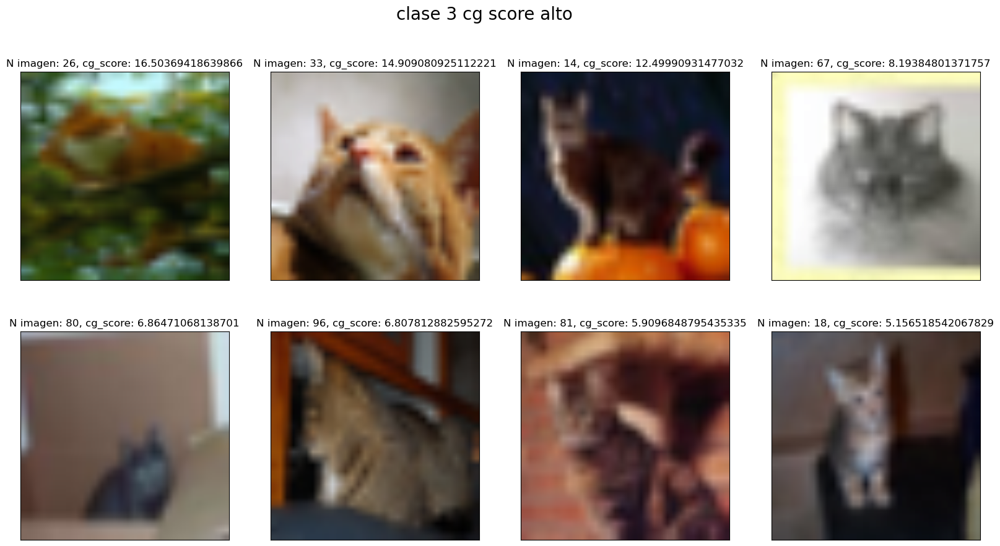

In [90]:
sorted_idx = df_ordenado_3.index
sorted_idx_dataset_3 = sorted_idx +103+103+103
sorted_idx_dataset_3
largo = len(sorted_idx)
cg_score_value = df_ordenado_3['clase_3']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx_dataset_3[:8]],[f'N imagen: {x}, cg_score: {cg_score_value[x]}'for x in sorted_idx[:8]],
title = 'clase 3 cg score alto', images_per_row = 4)

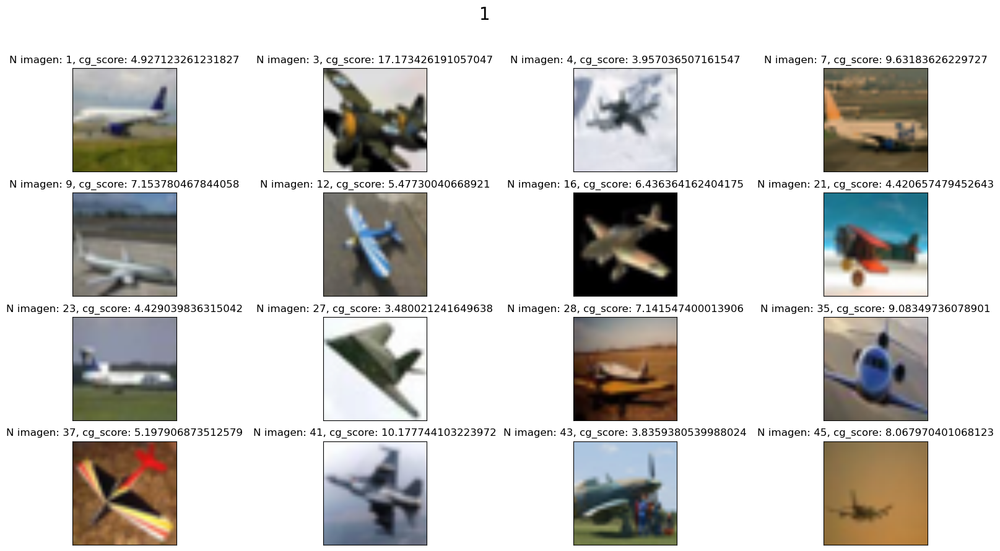

In [213]:
sorted_idx = df_2[df_2['clase_0_mayor_promedio'] == True].index
largo = len(sorted_idx)
cg_score_value = df_2['clase_0']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx[:16]],[f'N imagen: {x}, cg_score: {cg_score_value[x]}'for x in sorted_idx[:16]],
title = 1 )

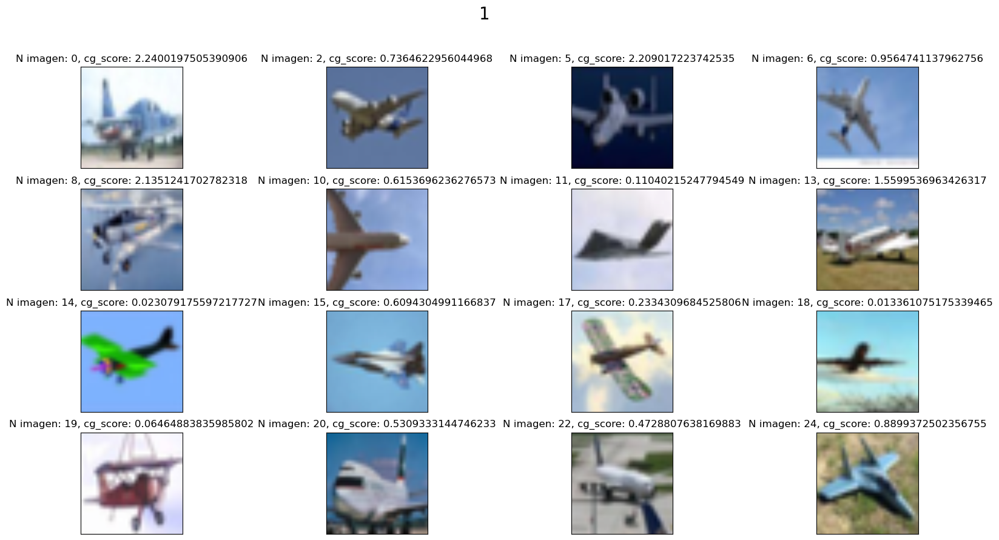

In [214]:
sorted_idx = df_2[df_2['clase_0_mayor_promedio'] == False].index
largo = len(sorted_idx)
cg_score_value = df_2['clase_0']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx[:16]],[f'N imagen: {x}, cg_score: {cg_score_value[x]}'for x in sorted_idx[:16]],
title = 1 )

In [ ]:
df_2[df_2['clase_4_mayor_promedio'] == True]

In [195]:
sorted_idx = df_2[df_2['clase_4_mayor_promedio'] == True].index 
sorted_idx = sorted_idx + 103*4
sorted_idx

Int64Index([415, 418, 419, 420, 424, 425, 429, 433, 434, 436, 440, 441, 442,
            448, 449, 450, 454, 464, 466, 469, 477, 478, 481, 484, 489, 492,
            493, 496, 497, 499, 501, 505, 507],
           dtype='int64')

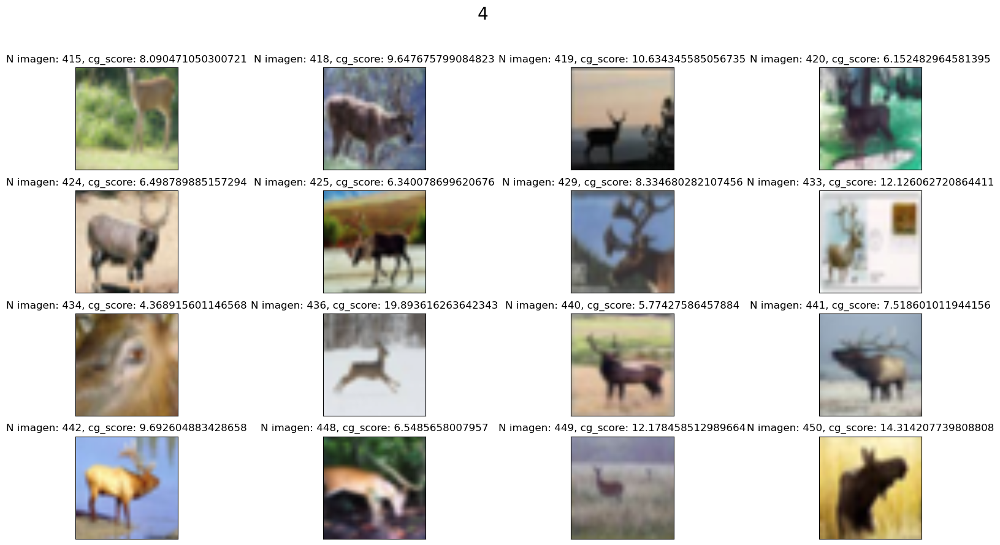

In [215]:

sorted_idx = df_2[df_2['clase_4_mayor_promedio'] == True].index 
sorted_idx = sorted_idx + 103*4
largo = len(sorted_idx)
cg_score_value = df_2['clase_4']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx[:16]],[f'N imagen: {x}, cg_score: {cg_scores[x]}'for x in sorted_idx[:16]],
title = 4 )

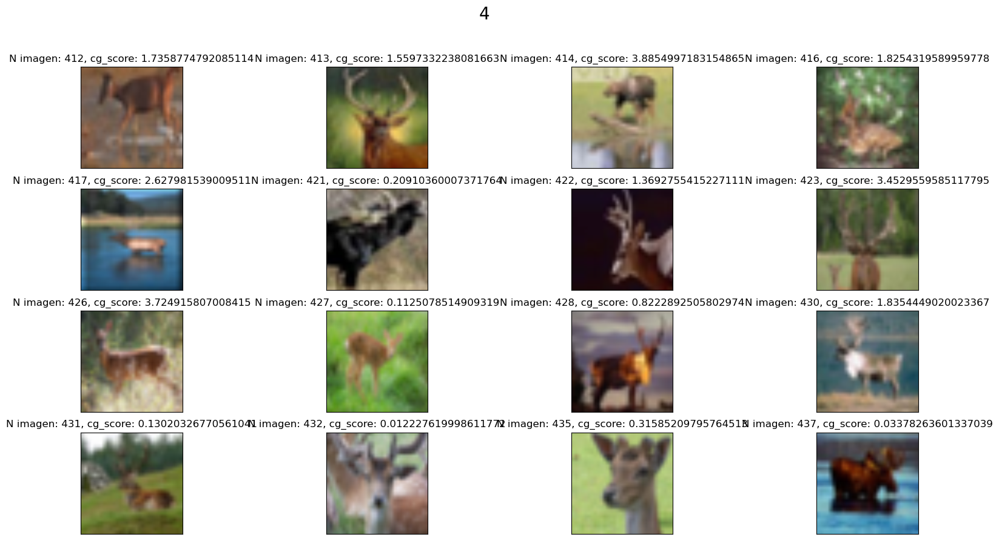

In [216]:

sorted_idx = df_2[df_2['clase_4_mayor_promedio'] == False].index 
sorted_idx = sorted_idx + 103*4
largo = len(sorted_idx)
cg_score_value = df_2['clase_4']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx[:16]],[f'N imagen: {x}, cg_score: {cg_scores[x]}'for x in sorted_idx[:16]],
title = 4 )

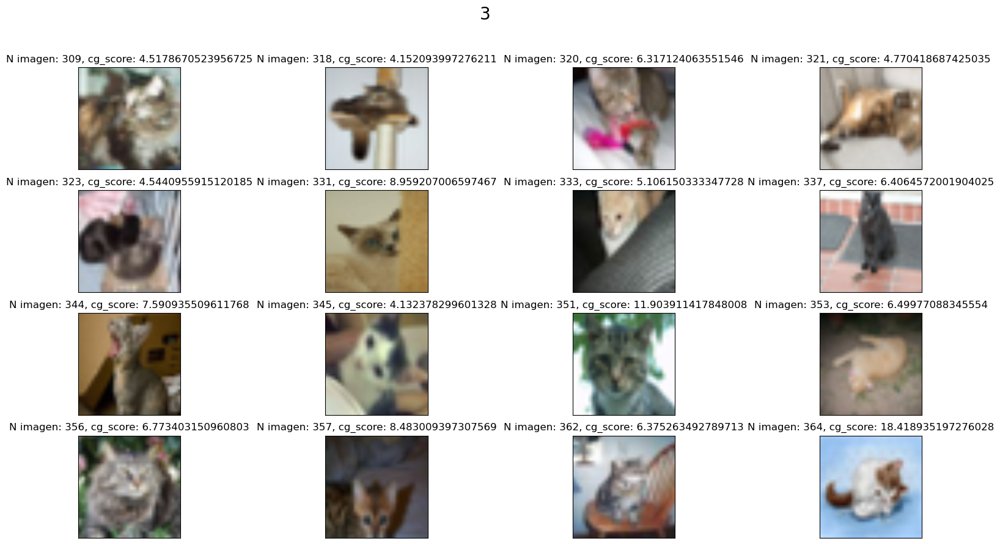

In [217]:
sorted_idx = df_2[df_2['clase_3_mayor_promedio'] == True].index 
sorted_idx = sorted_idx + 103*3
largo = len(sorted_idx)
cg_score_value = df_2['clase_3']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx[:16]],[f'N imagen: {x}, cg_score: {cg_scores[x]}'for x in sorted_idx[:16]],
title = 3 )

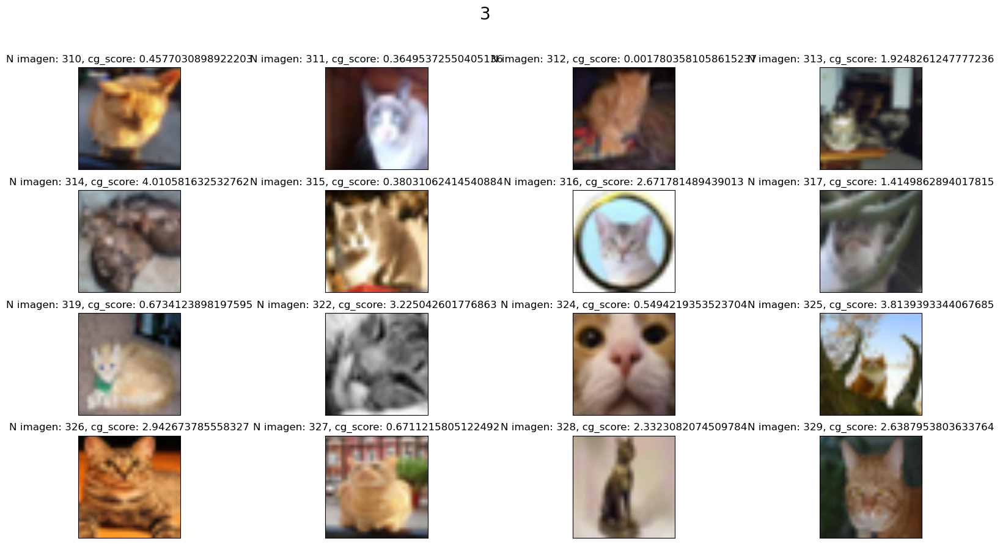

In [218]:
sorted_idx = df_2[df_2['clase_3_mayor_promedio'] == False].index 
sorted_idx = sorted_idx + 103*3
largo = len(sorted_idx)
cg_score_value = df_2['clase_3']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx[:16]],[f'N imagen: {x}, cg_score: {cg_scores[x]}'for x in sorted_idx[:16]],
title = 3 )

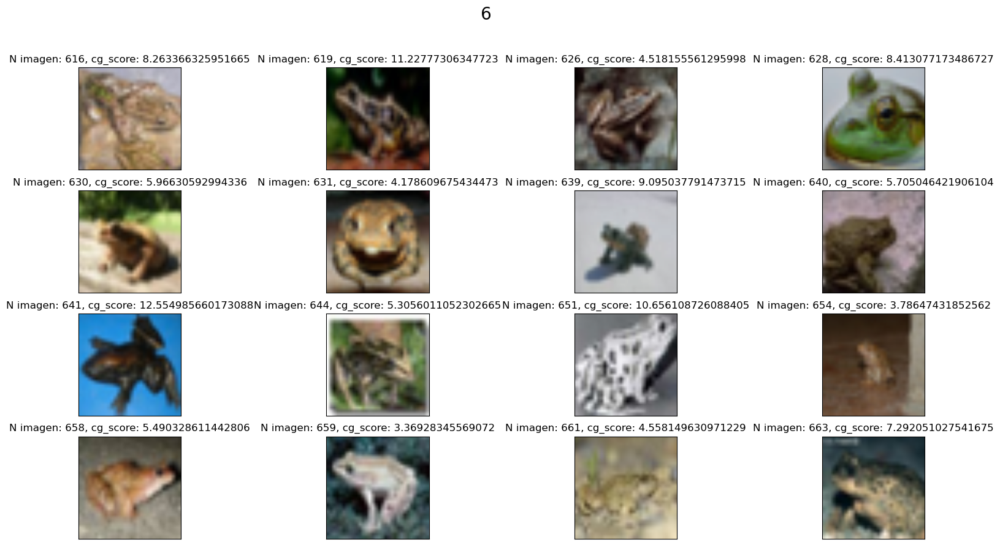

In [220]:
sorted_idx = df_2[df_2['clase_6_mayor_promedio'] == True].index 
sorted_idx = sorted_idx + 103*4 +102*2
largo = len(sorted_idx)
cg_score_value = df_2['clase_6']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx[:16]],[f'N imagen: {x}, cg_score: {cg_scores[x]}'for x in sorted_idx[:16]],
title = 6 )

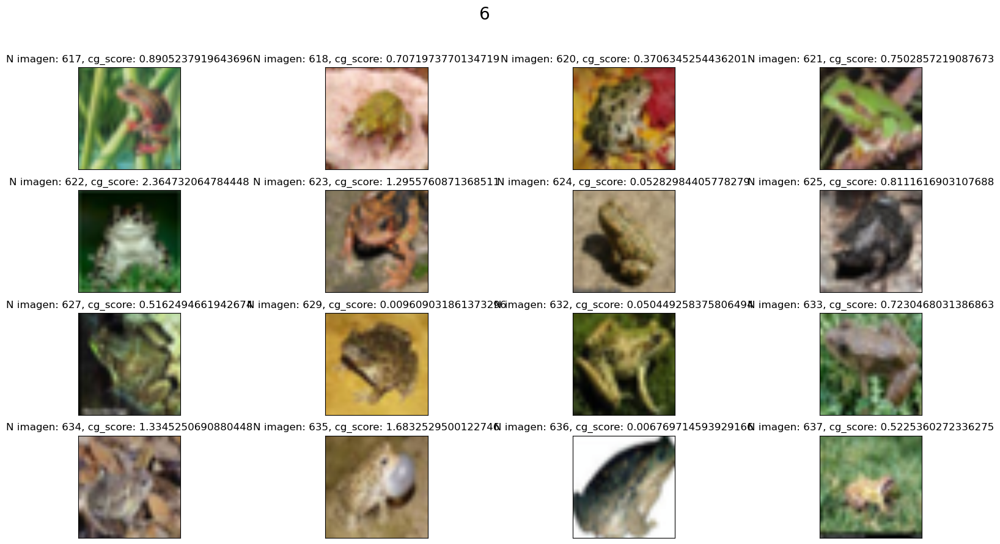

In [221]:
sorted_idx = df_2[df_2['clase_6_mayor_promedio'] == False].index 
sorted_idx = sorted_idx + 103*4+102*2
largo = len(sorted_idx)
cg_score_value = df_2['clase_6']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx[:16]],[f'N imagen: {x}, cg_score: {cg_scores[x]}'for x in sorted_idx[:16]],
title = 6 )

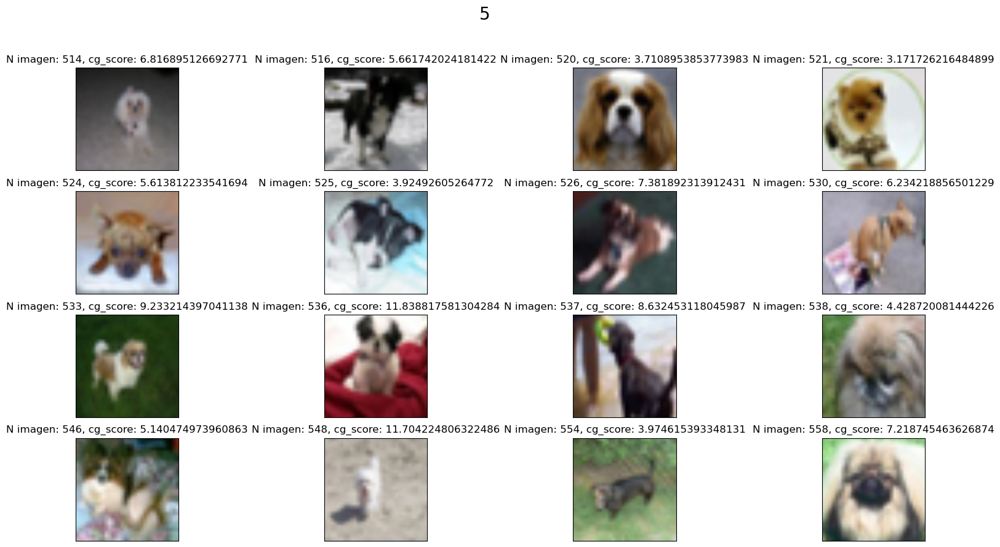

In [222]:
sorted_idx = df_2[df_2['clase_5_mayor_promedio'] == True].index 
sorted_idx = sorted_idx + 103*4 +102*1
largo = len(sorted_idx)
cg_score_value = df_2['clase_5']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx[:16]],[f'N imagen: {x}, cg_score: {cg_scores[x]}'for x in sorted_idx[:16]],
title = 5 )

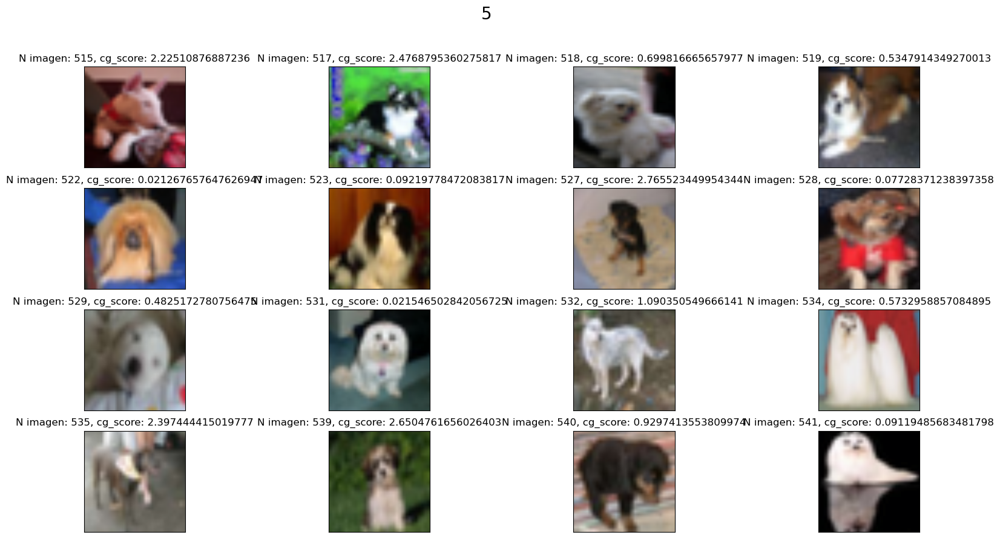

In [223]:
sorted_idx = df_2[df_2['clase_5_mayor_promedio'] == False].index 
sorted_idx = sorted_idx + 103*4 +102*1
largo = len(sorted_idx)
cg_score_value = df_2['clase_5']
 
value = sorted_idx[0]
imshow_grid([subset_train_dataset[x][0] for x in sorted_idx[:16]],[f'N imagen: {x}, cg_score: {cg_scores[x]}'for x in sorted_idx[:16]],
title = 5 )

In [ ]:
    'clase_0': 103,
    'clase_1': 103,
    'clase_2': 103,
    'clase_3': 103,
    'clase_4': 102,
    'clase_5': 102,
    'clase_6': 102,
    'clase_7': 102,
    'clase_8': 102,
    'clase_9': 102

In [182]:
promedio_por_clase = df.mean()
promedio_por_clase

clase_0    2.813435
clase_1    3.611340
clase_2    3.845434
clase_3    4.125043
clase_4    4.218134
clase_5    2.904238
clase_6    2.637789
clase_7    3.276813
clase_8    2.398090
clase_9    2.660265
dtype: float64